# Lab 5 - Photomosaicing
Raj Harshit Srirangam

In [1]:
# Import necessary libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
from utils import *
from harris import harris

/usr/local/lib/python3.10/dist-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


Photomosaicing was implemented on three image sets:

1. **Mural with 50% overlap**
2. **Cinder blocks**
3. **Mural with 15% overlap**

Each set contained 6 images.

A few modifications were made to the given functions, aside from replacing SIFT with Harris corner detection, to improve stitching across all three image sets. These changes are as follows:

1. **Harris Corner Parameters**: The functions were modified so that the parameters for Harris corner detection can be passed directly from the `create_panorama` function. This allows for the flexibility of tweaking the parameters, and even using different parameters for each image set.
  
2. **Image Warping Approach**: Instead of warping the stitched image to match the perspective of the new image, the new image was warped to align with the existing one. This approach has some disadvantages, as the area most likely to contain the best-matching features in the stitched image will be distorted, potentially ruining the stitching (Spoiler: this will be discussed further).

3. **Outlier Removal**: To remove outliers and simplify computation, only the portion of the stitched image corresponding to the newly added image is used to compute keypoints. This approach assumes that each added image is consistently positioned either to the left or right of the previous image, without alternating between the two. A mask based on the newly added image was created and passed as an argument to the Harris corner detection function.

---

The changes implemented are shown below. Note that only the functions provided in the notebook were modified, while the `utils` and `harris` files remain unchanged. The hsize and the size of the feature descriptor were both 5 for all the 3 image sets for simplicity.


In [2]:

def detect_and_compute_keypoints(img, stitch_mask=None, **harris_params):
    """
    Detect keypoints and compute descriptors for each image using SIFT.
    """
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Step 2: Use the Harris corner detector to get interest points
    ii, jj, _ = harris.harris(img, mask=stitch_mask, **harris_params)  # Harris corner detection (returns row/col of interest points)
    
    # Step 3: Convert (ii, jj) coordinates to cv2.KeyPoint objects for SIFT
    keypoints = [cv2.KeyPoint(x=float(j), y=float(i), size=5) for i, j in zip(ii, jj)]
    
    # Step 4: Use SIFT to compute descriptors for each of the Harris keypoints
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.compute(img, keypoints)
    
    return keypoints, descriptors

def stitch_images(img1, img2, kp1, kp2, matches):
    """
    Stitch two images together using matched keypoints and RANSAC to find homography.
    This version warps image 2 onto image 1 and returns a mask that highlights the region
    corresponding to image 2 in the final stitched image.
    
    Returns:
    - result: The final stitched image.
    - mask: A binary mask where the newly added region (image 2) is highlighted.
    """
    # Extract matched keypoints
    img1_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    img2_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
    
    # Compute homography matrix using RANSAC
    H, mask = cv2.findHomography(img2_pts, img1_pts, cv2.RANSAC, 5.0)
    
    # Warp image 2 onto image 1 and create padded images
    img2_warped, img1_padded = warpPerspectivePadded(img2, img1, H)
    
    # Create the stitched image by blending img2_warped and img1_padded
    stitched_image = masking(img2_warped, img1_padded, 0.5)
    
    # Create the binary mask (single-channel) for the newly added image (img2 in the stitched result)
    img2_mask = np.zeros((stitched_image.shape[0], stitched_image.shape[1]), dtype=np.uint8)
    
    # Set the mask to 255 where img2 is present in the stitched image
    # Here, we check where the non-zero values from img2_warped exist
    img2_mask[np.any(img1_padded != 0, axis=-1)] = 255
    
    # Return both the stitched image and the binary mask
    return np.uint8(stitched_image), img2_mask

def create_panorama(images, **harris_params):
    stitched_image = images[0]
    current_stitch_mask = None
    for i in range(1, len(images)):
        print(f"Stitching image {i-1} and {i}...")
        keypoints1, descriptors1 = detect_and_compute_keypoints(stitched_image, stitch_mask=current_stitch_mask, **harris_params)
        keypoints2, descriptors2 = detect_and_compute_keypoints(images[i], stitch_mask=None, **harris_params)
        
        matches = match_features(descriptors1, descriptors2)
        print(f"Number of good matches between stitched image and image {i}: {len(matches)}")

        draw_matches(stitched_image, images[i], keypoints1, keypoints2, matches, num_matches=30)
        
        stitched_image, current_stitch_mask = stitch_images(stitched_image, images[i], keypoints1, keypoints2, matches)
        
    return stitched_image

# Importing of the images

Images loaded successfully!
Images loaded successfully!
Images loaded successfully!


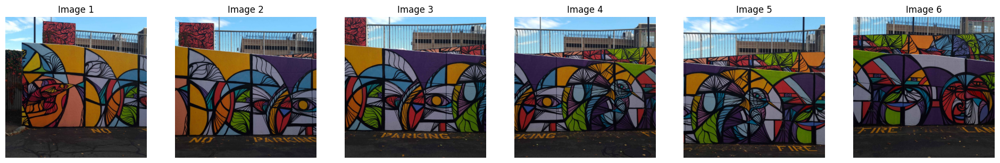

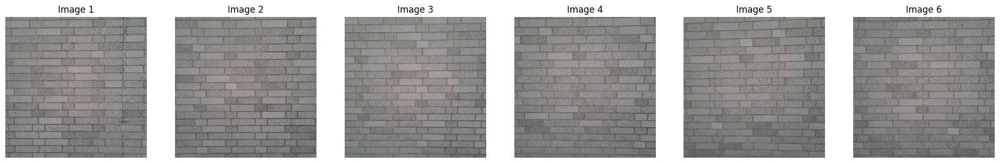

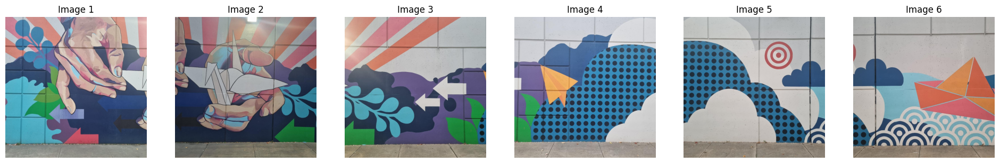

In [3]:
path2 = "./data/cinder"
path3 = "./data/mosaic15"
path1 = "./data/mosaic50"

images_set1 = load_images(path1)
images_set2 = load_images(path2)
images_set3 = load_images(path3)

# Image set 1 - Mural with 50% overlap

Stitching image 0 and 1...


/home/srirangamrh/stuff/eece5554/LAB5/harris/harris.py:96: RuntimeWarning: invalid value encountered in sqrt
  sqrt_term = np.sqrt(B**2 - 4*(IxIx * IyIy - IxIy**2))


Number of good matches between stitched image and image 1: 82


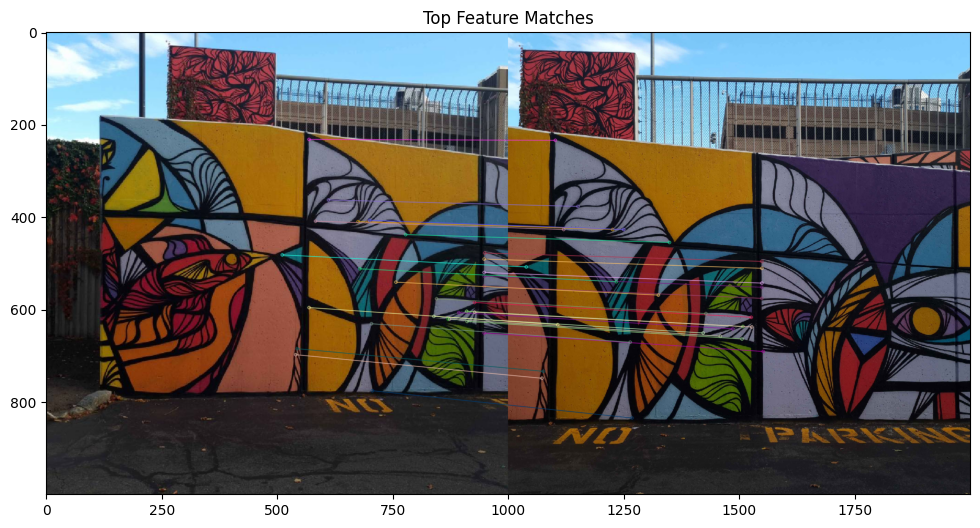

Stitching image 1 and 2...
Number of good matches between stitched image and image 2: 78


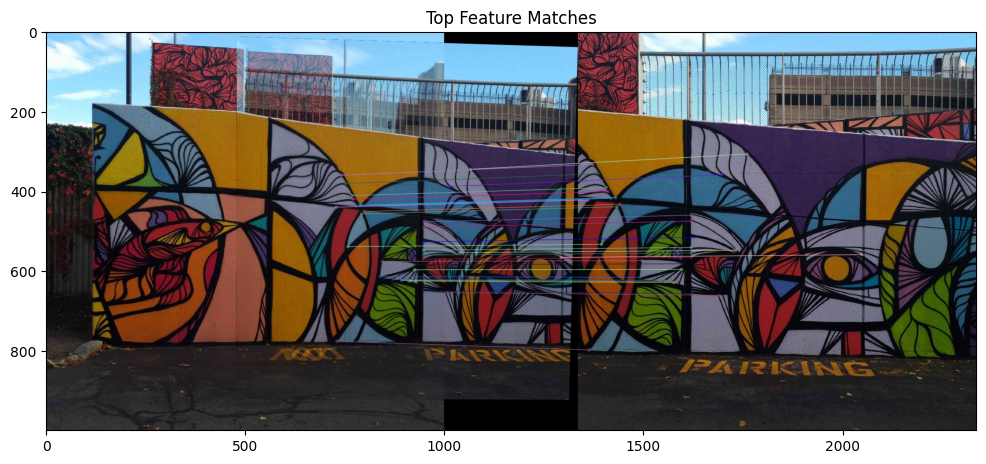

Stitching image 2 and 3...
Number of good matches between stitched image and image 3: 44


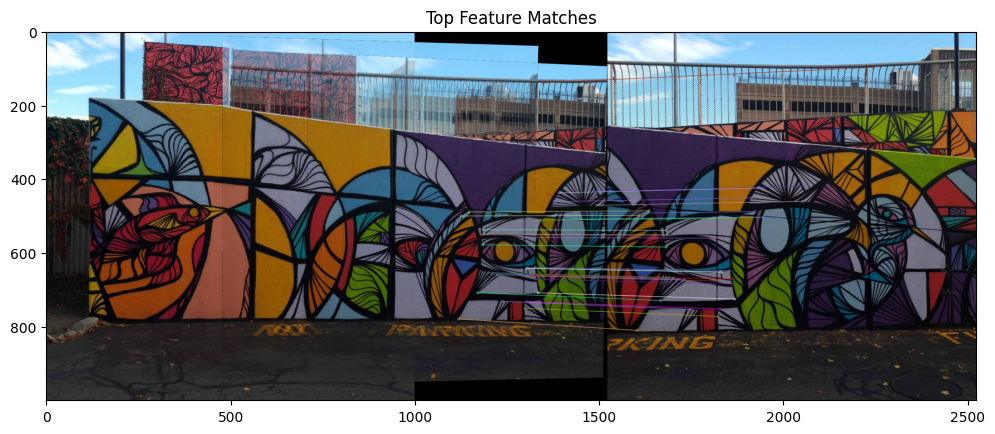

Stitching image 3 and 4...
Number of good matches between stitched image and image 4: 50


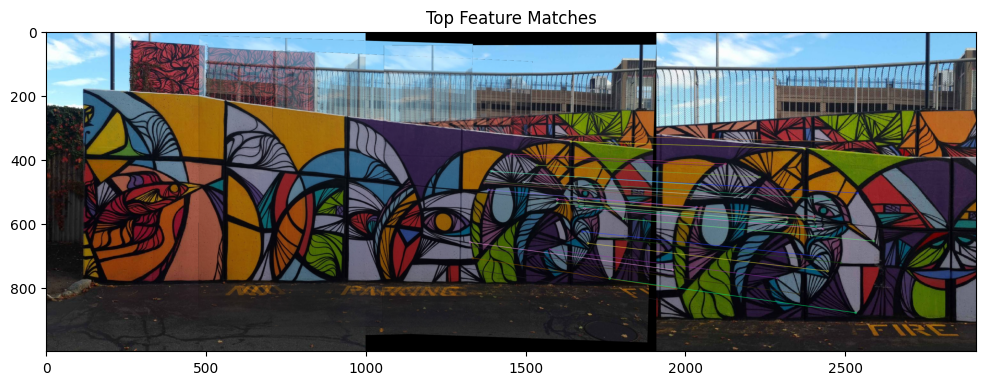

Stitching image 4 and 5...
Number of good matches between stitched image and image 5: 15


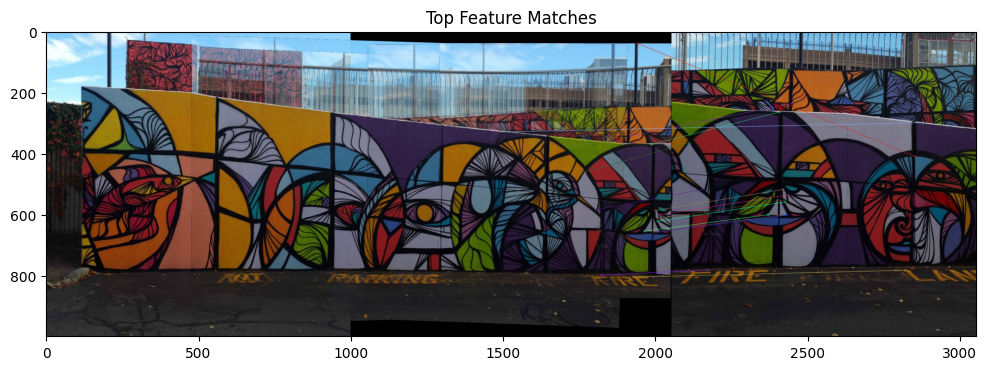

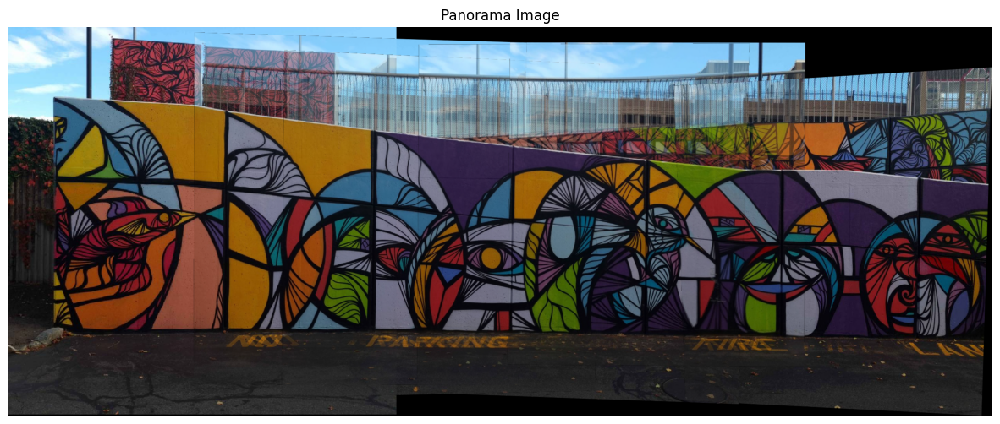

In [4]:
panorama1 = create_panorama(images_set1,
    N=500,             
    thresh=0.05,         
    hsize=5,             
    sigma=0.5,          
    eig=False,            
    tile=[5, 5],        
    fft=False            
)

# Display the final panorama
plt.figure(figsize=(15, 10))
plt.imshow(panorama1)
plt.title("Panorama Image")
plt.axis("off")
plt.show()

### Harris Corner Parameters Used:
- **N** = 500  
- **Thresh** = 0.05  
- **Hsize** = 5  
- **Sigma** = 0.5  
- **Eig** = False  
- **Tile** = [5, 5]  
- **FFT** = False  

---

### Image Set Analysis:
The challenge with this image set is due to the varying depth caused by elements such as the wall behind the mural, the sky, and the ground. Despite these variations, the main focus was to ensure the primary mural in the foreground was accurately stitched, regardless of how the rest of the scene turned out.

The value of **N** was chosen to minimize the likelihood of poor matches. A higher value of **N** increased the risk of bad matches, while values significantly higher (>800) or lower (<200) led to slight skewing in the final stitched image. The other parameters had minimal effect on the outcome. the tile size was made to be [5,5] to have a more even distribution of keypoints.

Ultimately, the stitching of the mural in the foreground was nearly perfect. However, elements in the background, such as the buildings, text on the ground, and the pole and wall, did not align well between images. This misalignment was expected due to the varying depth and perspective across the images. This can be verified from the matches plotted above. It can be observed that almost all the matches were concentrated between sections of the primary mural which is why the stitching was so accurate. It can also be seen that all of the bad matches were caused due to objects in the background.



# Image set 2 - Cinder Blocks

Stitching image 0 and 1...
Number of good matches between stitched image and image 1: 61


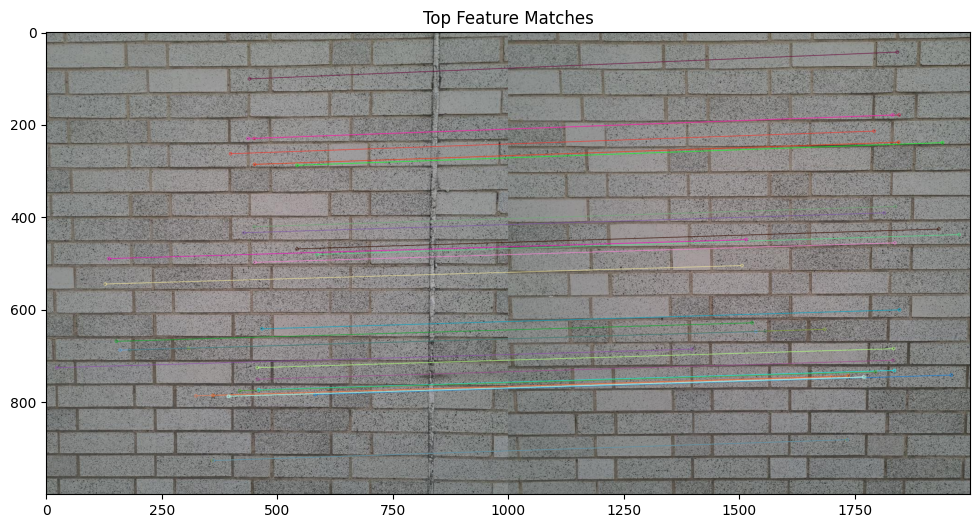

Stitching image 1 and 2...
Number of good matches between stitched image and image 2: 41


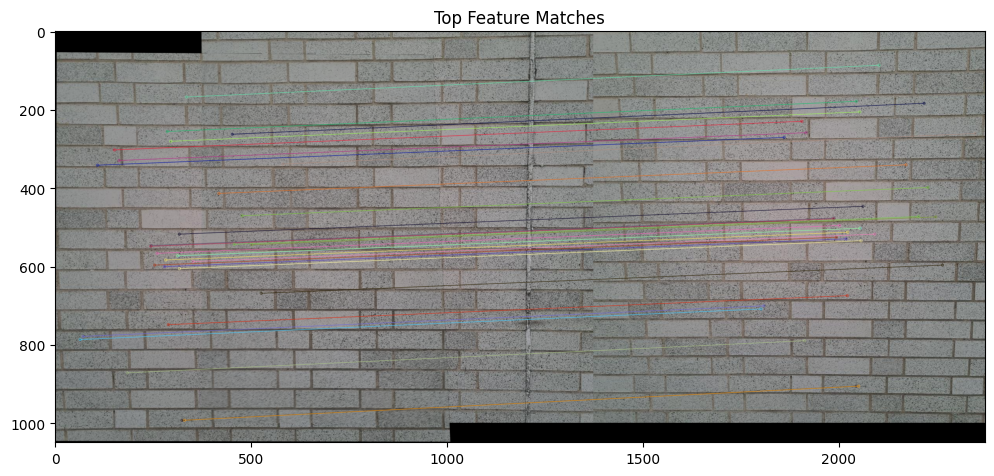

Stitching image 2 and 3...
Number of good matches between stitched image and image 3: 32


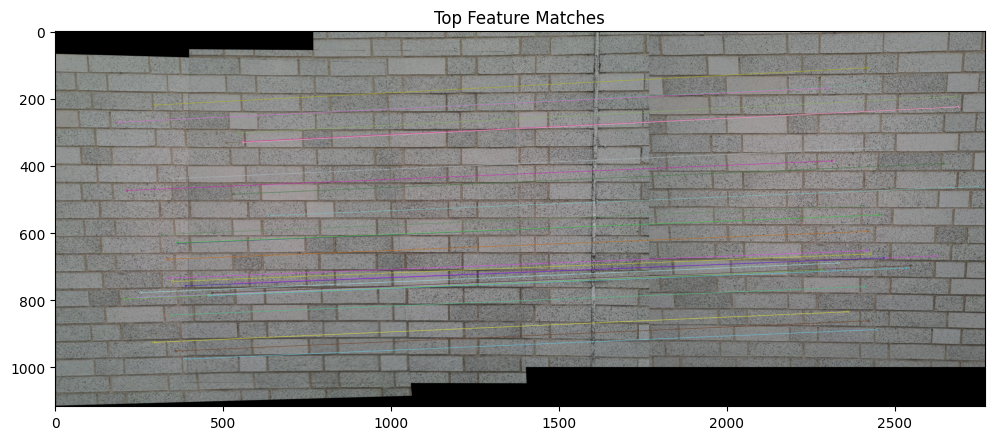

Stitching image 3 and 4...
Number of good matches between stitched image and image 4: 23


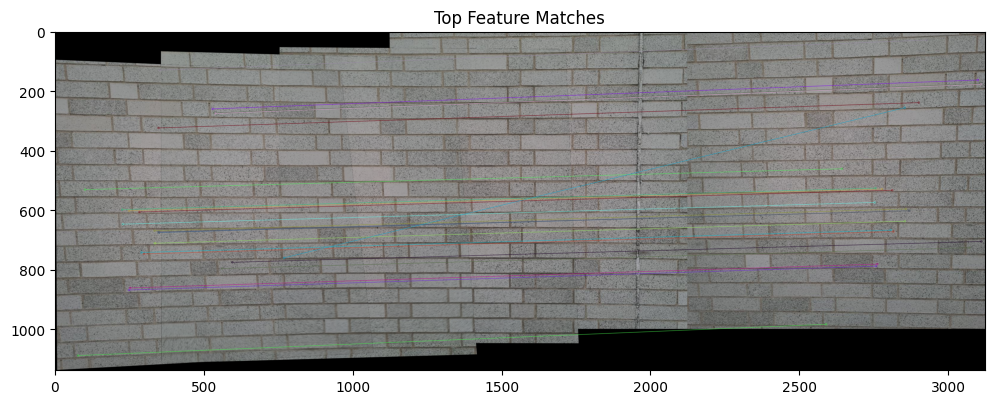

Stitching image 4 and 5...
Number of good matches between stitched image and image 5: 16


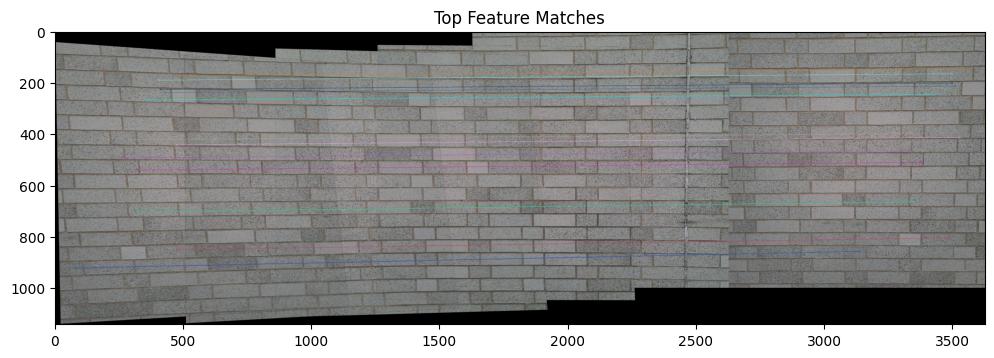

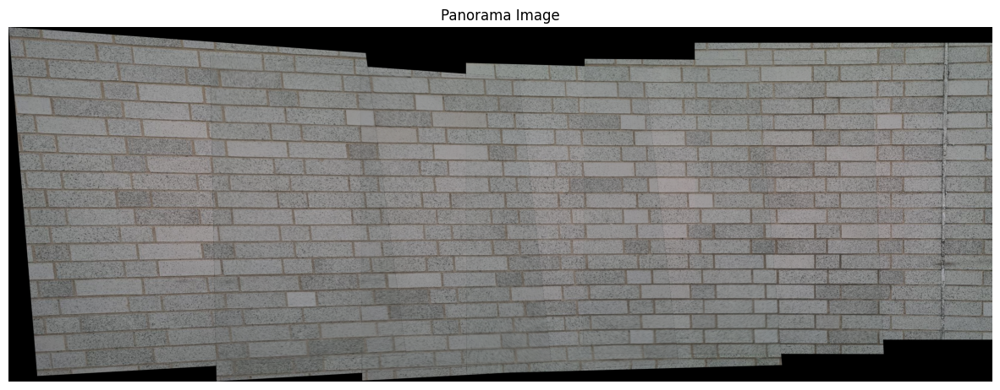

In [5]:
panorama2 = create_panorama(images_set2,
    N=200,             
    thresh=0.15,         
    hsize=5,             
    sigma=0.5,          
    eig=False,            
    tile=[3, 3],        
    fft=False            
)

# Display the final panorama
plt.figure(figsize=(15, 10))
plt.imshow(panorama2)
plt.title("Panorama Image")
plt.axis("off")
plt.show()

### Harris Corner Parameters Used:
- **N** = 200  
- **Thresh** = 0.15  
- **Hsize** = 5  
- **Sigma** = 0.5  
- **Eig** = False  
- **Tile** = [3, 3]  
- **FFT** = False  

---

### Image Set Analysis:

The challenge with the cinder blocks image set is from the uniformity and texture of the blocks, making it difficult to detect distinct features across the images. Additionally, the images were captured close to the wall, meaning any alignment issues would have a more significant effect compared to the other image sets.

Due to the similarity of features, bad matches were more likely in this set. To mitigate this, **N** was set to 200 and the **threshold** was increased to 0.15. Lower values of **N** caused the last image pair to have too few matches. Since the concentration of keypoints was less critical than ensuring good matches, the **tile size** was set to [3, 3]. The other parameters remained unchanged because increasing parameters related to smoothing (**hsize** and **sigma**) resulted in false positives due to the uniformity of the cinder blocks.

The final result was very accurate as the edges of the tiles, which should remain straight, stayed almost aligned correctly in the stitched image. Very few bad matches can be observed from the ones plotted above.




# Image set 3 - Mural with 15% overlap

Stitching image 0 and 1...
Number of good matches between stitched image and image 1: 158


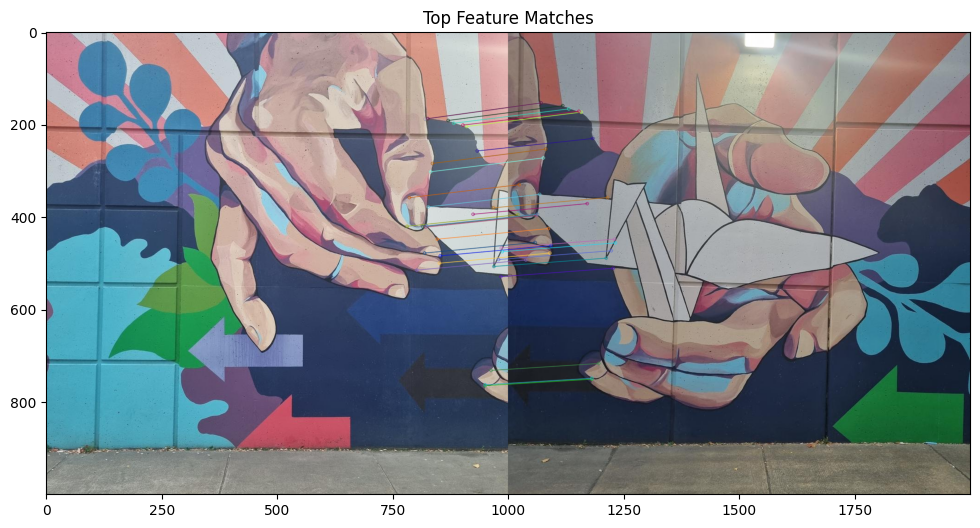

Stitching image 1 and 2...
Number of good matches between stitched image and image 2: 40


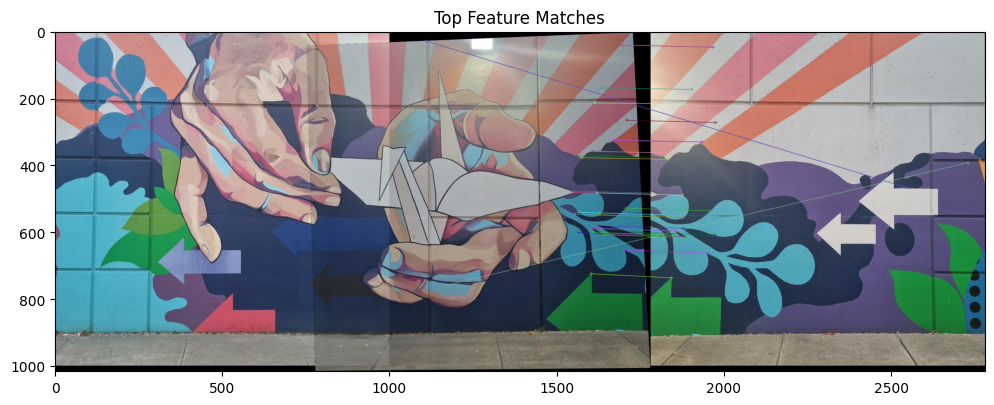

Stitching image 2 and 3...
Number of good matches between stitched image and image 3: 79


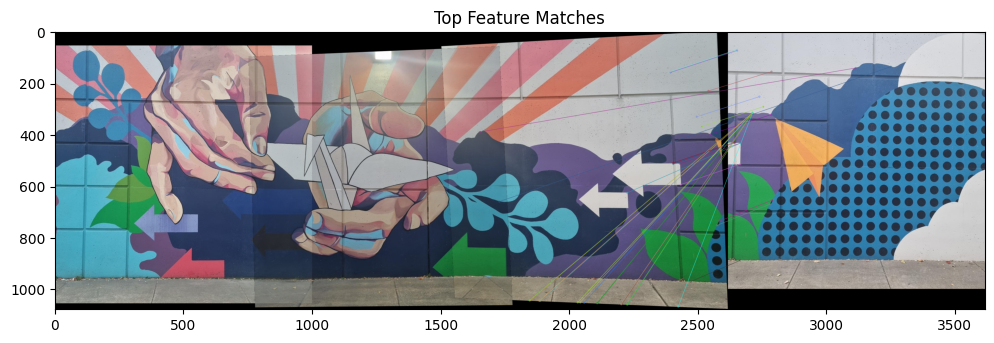

Stitching image 3 and 4...
Number of good matches between stitched image and image 4: 95


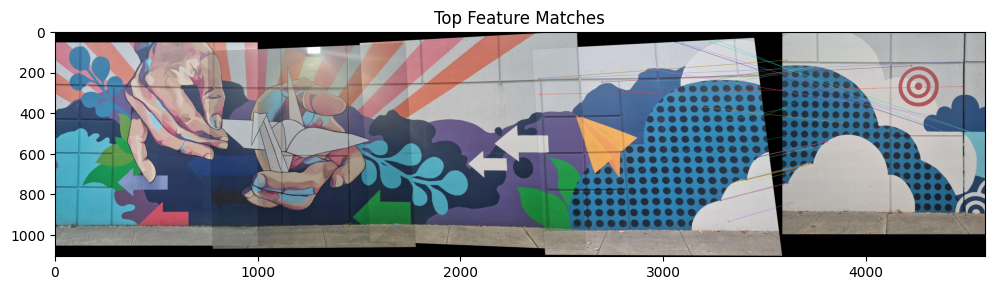

Stitching image 4 and 5...
Number of good matches between stitched image and image 5: 51


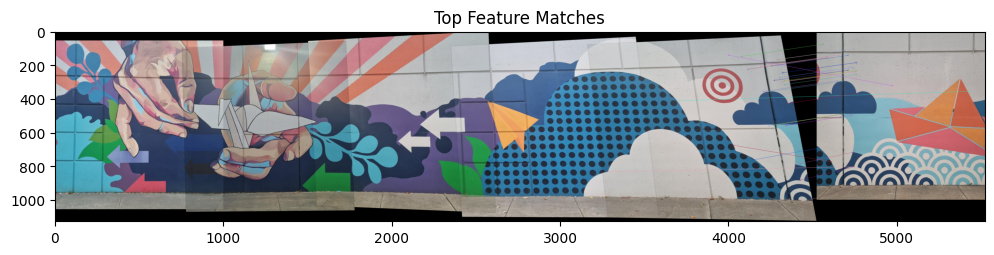

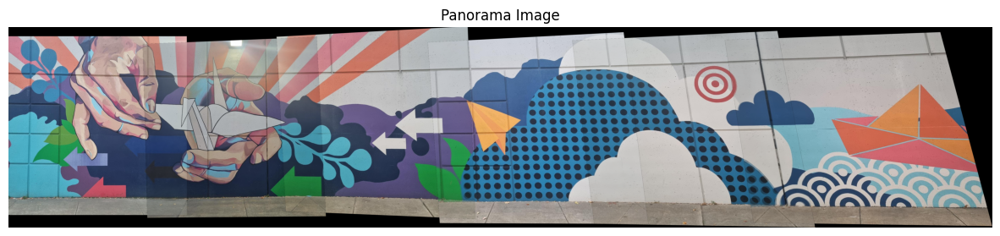

In [6]:
panorama3 = create_panorama(images_set3,
    N=1500,             
    thresh=0.2,         
    hsize=5,             
    sigma=0.5,          
    eig=False,            
    tile=[3,3],        
    fft=False            
)

# Display the final panorama
plt.figure(figsize=(15, 10))
plt.imshow(panorama3)
plt.title("Panorama Image")
plt.axis("off")
plt.show()

### Harris Corner Parameters Used:
- **N** = 1500  
- **Threshold** = 0.2  
- **Hsize** = 5  
- **Sigma** = 0.5  
- **Eig** = False  
- **Tile** = [3, 3]  
- **FFT** = False  

---

### Image Set Analysis:

The main challenge with this image set was the limited shared features between adjacent images. The small overlap made it difficult to identify enough matching points, which led to potential misalignments and poor stitching. Additionally, illumination varied across the images, particularly in one image where a light source was captured, further complicating the stitching process.

This is where the issue with the different warping approach became more apparent. Due to the limited shared features, the misalignments were much more noticeable. Although these misalignments did not accumulate as they did with the original approach, they still affected the matches, resulting in many bad matches. This was especially problematic because parts of the image containing the matched features became skewed during the warping process.

To counteract this, **N** was set to 1500 to increase the number of features detected. Although this led to more bad matches, having a larger number of features ensured that the best matches would still be good enough for accurate stitching. The **tile size** was set to [3, 3] to prioritize obtaining better matches than even distribution.

The final result was fairly accurate but slightly worse than the other two image sets, which was to be expected. The straight lines were mostly preserved, but slight errors can be noticed in the final two images. These errors are a result of the limited matching area the bad matches mentioned earlier which are particularly noticeable in the later images of the sequence.




# Results

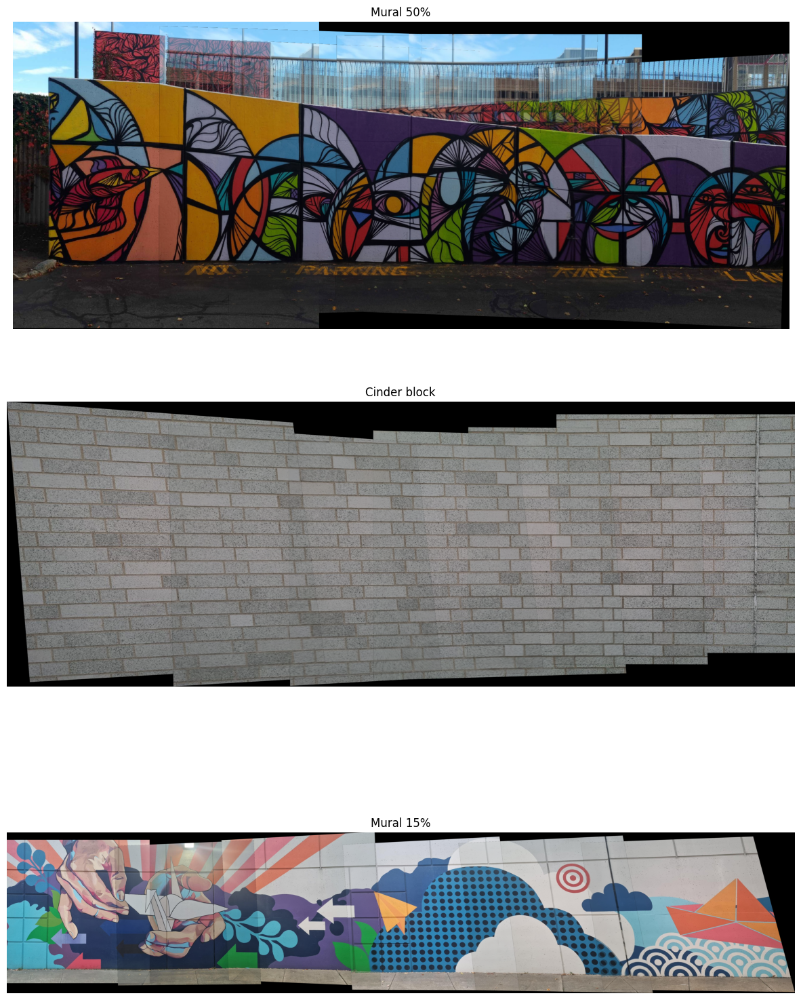

In [7]:
plt.figure(figsize=(15, 20)) 

plt.subplot(3, 1, 1)  # 3 rows, 1 column, 1st subplot
plt.imshow(panorama1)
plt.title("Mural 50%")
plt.axis("off")

plt.subplot(3, 1, 2)  # 3 rows, 1 column, 2nd subplot
plt.imshow(panorama2)
plt.title("Cinder block")
plt.axis("off")

plt.subplot(3, 1, 3)  # 3 rows, 1 column, 3rd subplot
plt.imshow(panorama3)
plt.title("Mural 15%")
plt.axis("off")

# Display the plot
plt.show()